In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import json
from PIL import Image
import cv2
import keras

print("Hello")
images_path = "data/covid/images/"

Hello


In [36]:
metadata = pd.read_csv("data/covid/metadata.csv")
with open('data/covid/annotations/imageannotation_ai_lung_bounding_boxes.json', 'r') as f:
    image_annotations = json.load(f)
print(image_annotations["images"][4])

{'license': 1, 'file_name': 'nejmc2001573_f1a.jpeg', 'height': 1272, 'width': 1645, 'id': 5, 'metadata': {'patientid': '4', 'offset': '0', 'sex': 'F', 'age': '52', 'finding': 'COVID-19', 'view': 'PA', 'modality': 'X-ray', 'date': 'January 25, 2020', 'location': 'Changhua Christian Hospital, Changhua City, Taiwan', 'doi': '10.1056/NEJMc2001573', 'url': 'https://www.nejm.org/doi/full/10.1056/NEJMc2001573', 'clinical notes': 'diffuse infiltrates in the bilateral lower lungs'}}


[1, 1, 1, 1, 1, 1, -1, 1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, -1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Max width: 4095, Max height: 4280
Min width: 237, Min height: 255


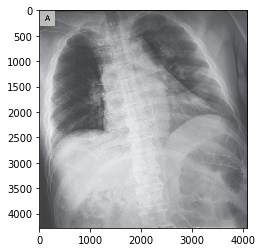

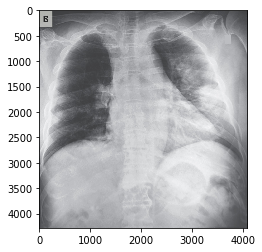

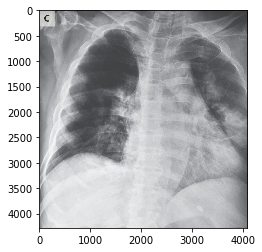

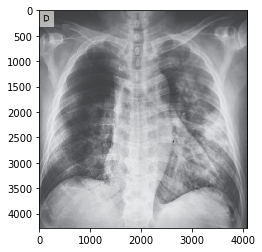

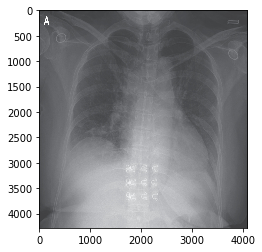

...

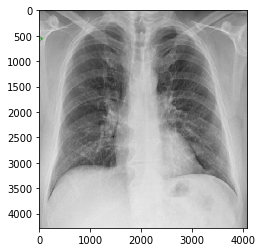

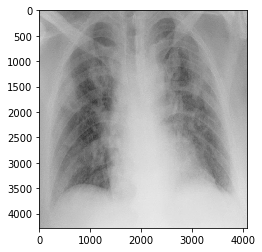

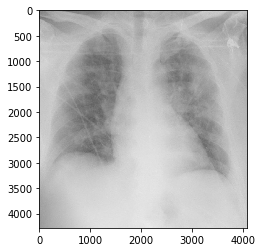

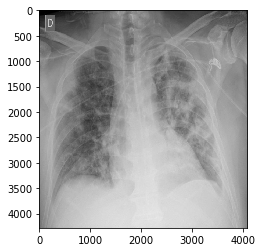

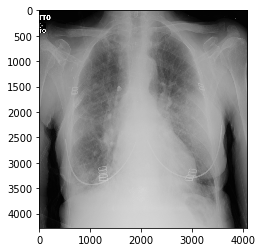

In [ ]:
# Data preprocessing
labels = []
min_height = 10000000
min_width = 100000000
max_height = 0
max_width = 0
imgs = []
for img_data in image_annotations["images"]:
#     turn each image into numpy array
#     create list of labels
    pic_name = img_data['file_name']
    img_numpy = cv2.imread(images_path+pic_name)
    img_numpy = cv2.cvtColor(img_numpy, cv2.COLOR_RGB2BGR)
    imgs.append(img_numpy)
#     print(img_numpy.shape)
#     plt.imshow(img_numpy)
#     plt.show()
    if img_numpy.shape[1] > max_height:
        max_height = img_numpy.shape[1]
    elif img_numpy.shape[1] < min_height:
        min_height = img_numpy.shape[1]
    if img_numpy.shape[0] > max_width:
        max_width = img_numpy.shape[0]
    elif img_numpy.shape[0] < min_width:
        min_width = img_numpy.shape[0]
    if img_data['metadata']['finding'].find('COVID-19') != -1:
        labels.append(1)
#         print(img_data['metadata']['finding'])
    else:
#         print(img_data['metadata']['finding'])
        labels.append(-1)
print(labels)
print("Max width: {}, Max height: {}".format(max_width, max_height))
print("Min width: {}, Min height: {}".format(min_width, min_height))
dim = (max_width, max_height)
resized_imgs = []
for img in imgs:
    img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    resized_imgs.append(img)
    plt.imshow(img)
    plt.show()
    
resized_imgs = np.asarray(resized_imgs)
img_mean = np.mean(resized_imgs)
img_std = np.std(resized_imgs)
vectorise_standardise = np.vectorise(lambda i: (i-img_mean)/img_std)
imgs = vectorise_standarise(resized_imgs)

In [ ]:
# In here we will do our CNN work